## Imports

In [1]:
import pandas as pd
import cv2
import os
import matplotlib.pyplot as plt
import glob
import shutil
from pathlib import Path
import seaborn as sns
import numpy as np
import math
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
from collections import defaultdict

## Project Summary

This project leverages FlowCam technology to automate the classification of algal cells in laboratory cultures, aiming to enhance the understanding of algal diversity. Utilizing both the high-resolution images and the detailed data provided by FlowCam, the project involves preprocessing these images to isolate individual cells and filter out empty or irrelevant data. A significant part of this preprocessing includes grouping images based on their features and selecting the most representative image for each grouping. This approach ensures the dataset is optimally prepared for the machine learning phase. The core objective is to develop a machine learning model that can accurately classify different algal species or groups, thereby streamlining the cell counting process and reducing manual labor. This approach not only promises to improve the efficiency and accuracy of algal analysis but also provides deeper insights into the diversity and characteristics of algae in various cultures.

## Problem Statement 

### Challenge in Aquatic Life Sciences
The manual process of identifying and counting algal cells is both time-consuming and prone to errors. Current methods in aquatic life sciences laboratories rely heavily on visual inspection, which is not only labor-intensive but also introduces a high potential for inaccuracies.

### Opportunity with FlowCam Technology
The use of FlowCam, which provides detailed images and corresponding data of algal cells, presents a significant opportunity for improvement. This technology can revolutionize the cell analysis process by introducing automation, thereby enhancing accuracy and efficiency in research.

## Segment Images Algorithm

- **Initial Challenge:** The raw data provided consisted of sheets of cell images of various sizes. These sheets needed to be processed to isolate each cell image for detailed analysis.
- **Developed Solution:** An algorithm was developed to segment individual cell images from these sheets. This segmentation involved detecting the boundaries of each cell and separating them from the sheet.
- **Resulting Dataset:** Post-segmentation, each cell image was saved as a separate file in designated directories, creating an organized and accessible dataset for further processing.
- **TO RUN:** Provide an input directory and output directory and this function will automatically look at all images in the input directory and put them in the output directory

Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000001.tif...
Extracted 233 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000001.tif.


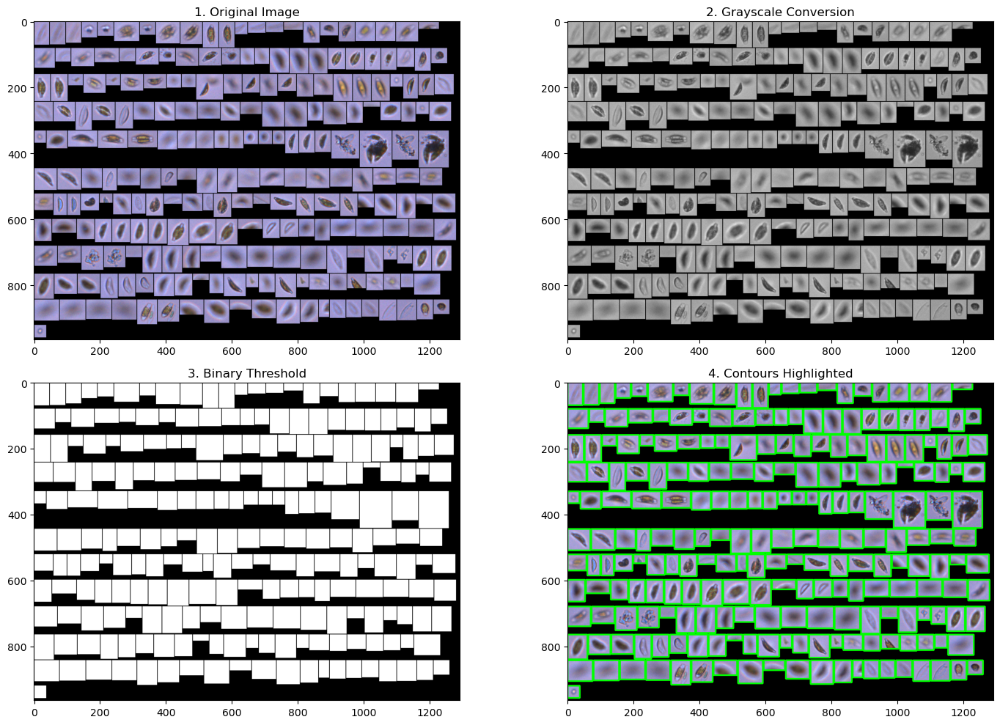

Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000002.tif...
Extracted 206 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000002.tif.
Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000003.tif...
Extracted 206 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000003.tif.
Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000004.tif...
Extracted 147 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000004.tif.
Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000005.tif...
Extracted 211 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000005.tif.
Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000006.tif...
Extracted 178 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000006.tif.
Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000007.tif...
Extracted 212 images from data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000007.tif.
Processing data\IN-2A\IN2-A 08-16-23 1-100 Dilution_000008.tif...
Extracted 156 images from data\IN-2A\IN2-A 08-16-23 1-100 Diluti

In [2]:
def segment_image(input_dir, output_dir, min_area=100):
    """
    Processes .tif files (except binary) in the input directory, extracting cell images from each
    and saving them in sorted order in the output directory.

    Currently takes ONE directory and outputs to ONE directory

    Hardcoded the label (WK1-..., WK2-..., IN-...)

    Parameters:
    - input_dir: The directory containing the .tif files to process.
    - output_dir: The directory where the rectangle images will be saved.
    - min_area: The minimum area threshold for a contour to be considered a valid rectangle.
    
    Returns:
    - extracted_counts: A dictionary with file numbers as keys and the count of extracted images as values.
    """
    # ensure the output directory exists
    if not os.path.isdir(output_dir):
        os.makedirs(output_dir)

    # initialize a counter for the filenames
    file_counter = 1
    # initialize a dictionary for the counts
    extracted_counts = {}

    # get all .tif files in the input directory
    tif_files = sorted(glob.glob(os.path.join(input_dir, '*.tif')))

    for tif_file in tif_files:
        # filter binary images
        if "bin" in tif_file:
            continue

        # read the image
        image = cv2.imread(tif_file)

        # extract the file number from the filename
        file_number = tif_file.split('_')[-1].split('.')[0]

        print(f"Processing {tif_file}...")
        
        # convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # apply a binary threshold to get cell image areas
        _, binary_threshold = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY)

        # find contours of the cell image areas
        contours, _ = cv2.findContours(binary_threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # filter out contours that are too small
        valid_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]

        # sort contours based on the position of their bounding box's top-left corner
        sorted_contours = sorted(valid_contours, key=lambda cnt: (cv2.boundingRect(cnt)[1], cv2.boundingRect(cnt)[0]))

        images_from_current_tif = 0
        # extract and save the rectangles
        for i, contour in enumerate(sorted_contours):
            x, y, w, h = cv2.boundingRect(contour)
            sorted_extracted_image = image[y:y+h, x:x+w]
            file_path = os.path.join(output_dir, f'IN-2A_{str(file_counter).zfill(6)}.png')
            cv2.imwrite(file_path, sorted_extracted_image)
            file_counter += 1
            images_from_current_tif += 1
        
        # save the count for the current file
        extracted_counts[file_number] = images_from_current_tif

        print(f"Extracted {images_from_current_tif} images from {tif_file}.")
        if tif_file == tif_files[0]:
            plt.figure(figsize=(15, 10))

            plt.subplot(2, 2, 1)
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title('1. Original Image')

            plt.subplot(2, 2, 2)
            plt.imshow(gray_image, cmap='gray')
            plt.title('2. Grayscale Conversion')

            plt.subplot(2, 2, 3)
            plt.imshow(binary_threshold, cmap='gray')
            plt.title('3. Binary Threshold')

            # Drawing contours on a copy of the original image
            contour_image = image.copy()
            cv2.drawContours(contour_image, sorted_contours, -1, (0, 255, 0), 3)

            plt.subplot(2, 2, 4)
            plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
            plt.title('4. Contours Highlighted')

            plt.tight_layout()
            plt.savefig('image_processing_steps.png')
            plt.show()
    return extracted_counts

input_directory = 'data\IN-2A' # hard coded to run through one folder of the images
output_directory = 'data\IN-All-Split\IN-2A' # output to new folder
extracted_counts = segment_image(input_directory, output_directory)


### Load .lst as Pandas DF

In [3]:
"""
Load one .lst as a Pandas Dataframe
"""

file_path = 'data\IN-2A\IN2-A 08-16-23 1-100 Dilution.lst' # hard coded to load one .lst

# number of metadata lines to skip (57 column header definitions)
skip_rows = 58

# column headers at top of .lst file
column_names = [
    'id', 'image_x', 'image_y', 'image_w', 'image_h', 'src_x', 'src_y', 'src_image',
    'cal_image', 'ppc', 'camera', 'cal_const', 'fringe_size', 'sphere_count',
    'raw_sphere_volume', 'raw_sphere_complement', 'raw_sphere_unknown', 'raw_area',
    'raw_feret_max', 'raw_feret_min', 'raw_feret_mean', 'raw_perimeter',
    'raw_convex_perimeter', 'raw_legendre_major', 'raw_legendre_minor', 'abd_area',
    'abd_diameter', 'length', 'width', 'esd_diameter', 'fd_diameter', 'perimeter',
    'convex_perimeter', 'intensity', 'sigma_intensity', 'sum_intensity', 'compactness',
    'elongation', 'roughness', 'edge_gradient', 'elapsed_time', 'circle_fit',
    'symmetry', 'circularity_hu', 'intensity_calimage', 'raw_convex_hull_area',
    'raw_filled_area', 'filled_area', 'feret_max_angle', 'feret_min_angle',
    'avg_red', 'avg_green', 'avg_blue', 'timestamp', 'collage_file', 'image_id'
]

df = pd.read_csv(file_path, delimiter='|', skiprows=skip_rows, header=None, names=column_names)

df

,id,image_x,image_y,image_w,image_h,src_x,src_y,src_image,cal_image,ppc,...,raw_filled_area,filled_area,feret_max_angle,feret_min_angle,avg_red,avg_green,avg_blue,timestamp,collage_file,image_id
0,1,0,0,47,71,79,138,37,1,1,...,400.0,75.3440,65.0,-25.0,149.2850,133.5325,170.7100,2023-08-17T13:59:34.256,IN2-A 08-16-23 1-100 Dilution_000001.tif,11EE9346-FD91-41A1-8EDA-2A316263E00D
1,2,49,0,47,70,79,565,38,1,1,...,392.0,73.4642,65.0,-25.0,138.4235,124.6199,158.5816,2023-08-17T13:59:34.306,IN2-A 08-16-23 1-100 Dilution_000001.tif,1515A658-D559-409B-91AD-A903B725122D
2,3,98,0,46,65,79,899,39,1,1,...,364.0,66.9239,70.0,-25.0,153.0797,137.1429,171.6951,2023-08-17T13:59:34.355,IN2-A 08-16-23 1-100 Dilution_000001.tif,62733676-A766-4EAD-9325-692998967FE1
3,4,146,0,46,49,301,41,44,1,1,...,485.0,95.5821,-80.0,0.0,136.2330,132.2577,183.3897,2023-08-17T13:59:34.606,IN2-A 08-16-23 1-100 Dilution_000001.tif,47AE87D0-45F0-4A73-999D-D8FC162E772E
4,5,194,0,48,44,298,416,45,1,1,...,462.0,90.0618,0.0,-90.0,131.5260,127.7922,174.7554,2023-08-17T13:59:34.656,IN2-A 08-16-23 1-100 Dilution_000001.tif,6BE4A8D9-1ADD-4FB9-B731-00BACE355697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2073,2074,139,573,40,56,33,823,3921,1,1,...,509.0,101.3732,-90.0,5.0,125.7505,109.3576,130.2849,2023-08-17T14:02:48.755,IN2-A 08-16-23 1-100 Dilution_000011.tif,0A69DD39-2B7F-4D61-92CF-E96E26F02CB1
2074,2075,181,573,63,51,664,230,3923,1,1,...,953.0,212.3752,0.0,-80.0,136.5530,124.7954,162.0315,2023-08-17T14:02:48.854,IN2-A 08-16-23 1-100 Dilution_000011.tif,DBB22699-4110-4E92-9FDE-BBC06B23D2FE
2075,2076,246,573,64,48,1172,590,3923,1,1,...,538.0,108.4099,20.0,-80.0,152.4610,140.4721,179.7212,2023-08-17T14:02:48.854,IN2-A 08-16-23 1-100 Dilution_000011.tif,3C797727-02E8-4B08-9D19-48E89CD213F5
2076,2077,312,573,62,61,667,466,3924,1,1,...,1081.0,245.2846,35.0,-55.0,138.3673,127.8585,166.9639,2023-08-17T14:02:48.904,IN2-A 08-16-23 1-100 Dilution_000011.tif,848BF537-A6EB-41A8-A5DA-CF16C441580C


## Filter Out Empty Images

### EDA of Images

#### Filters Applied to Cell Images Analysis

The filters applied to cell images help in identifying the presence of algal cells and their morphological features.
- **TO RUN:** Currently hardcoded to give paths to individual images for analysis purposes.

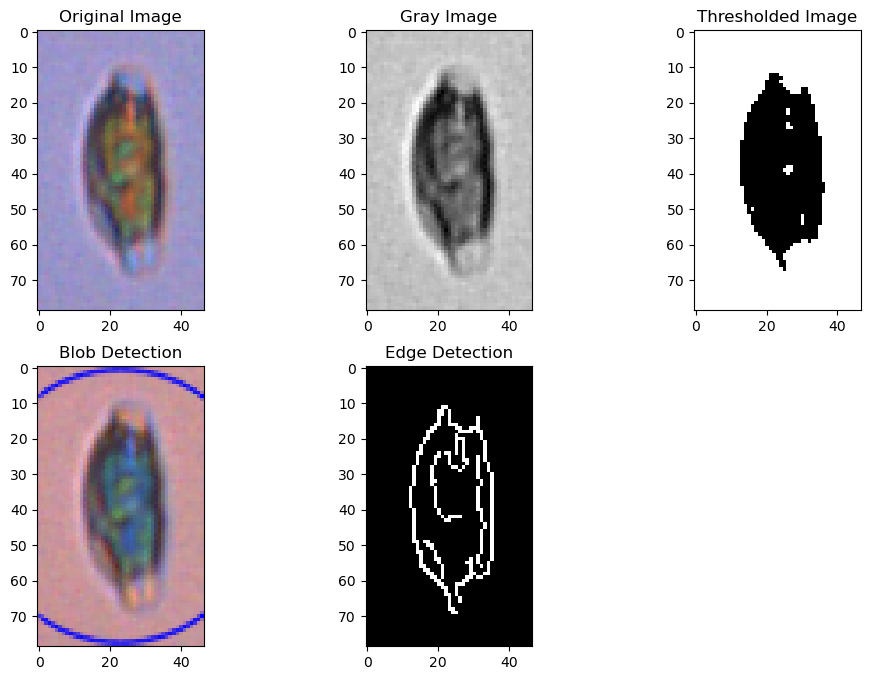

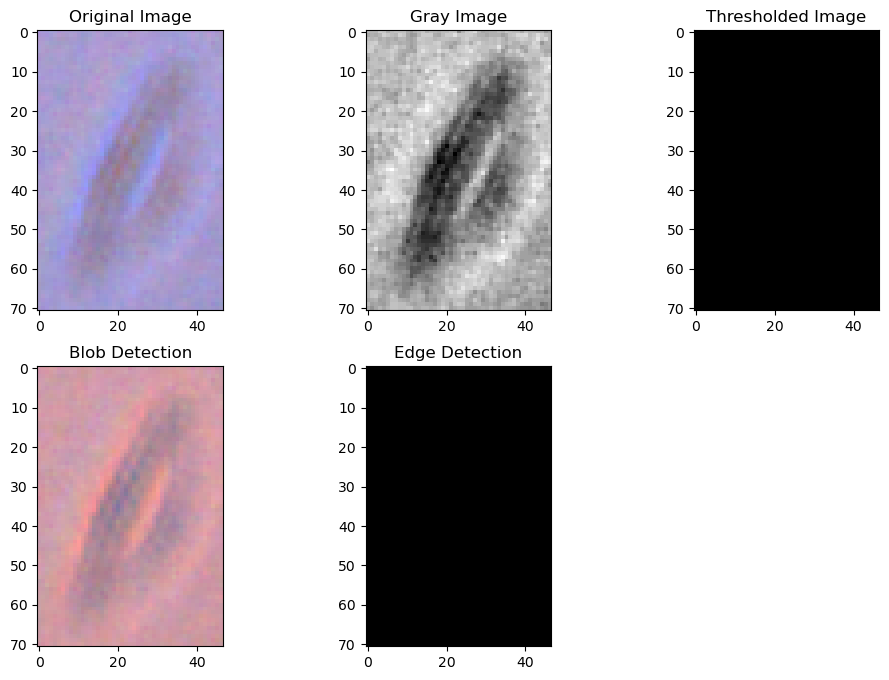

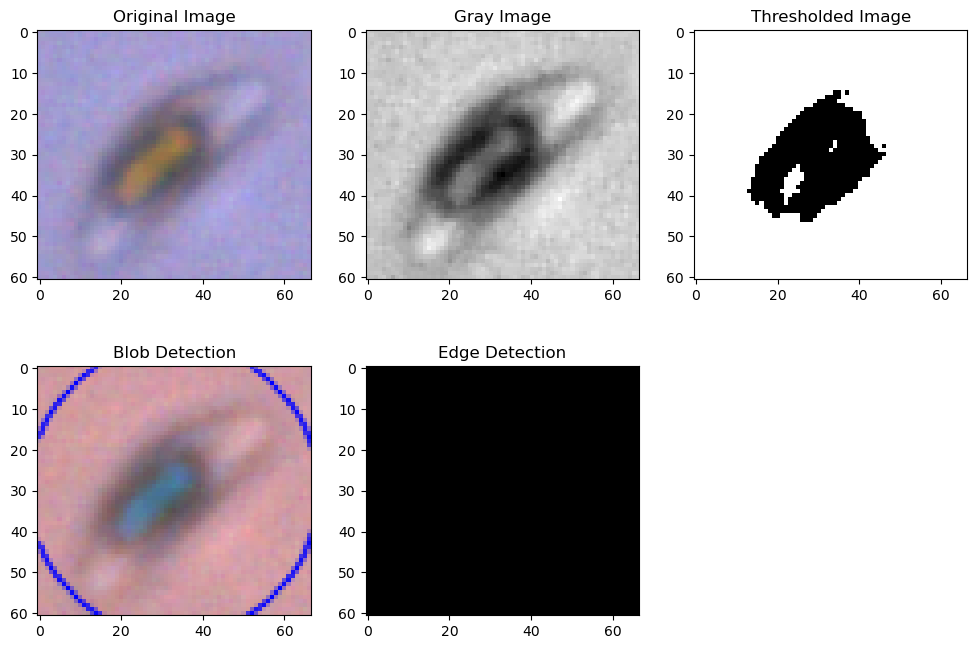

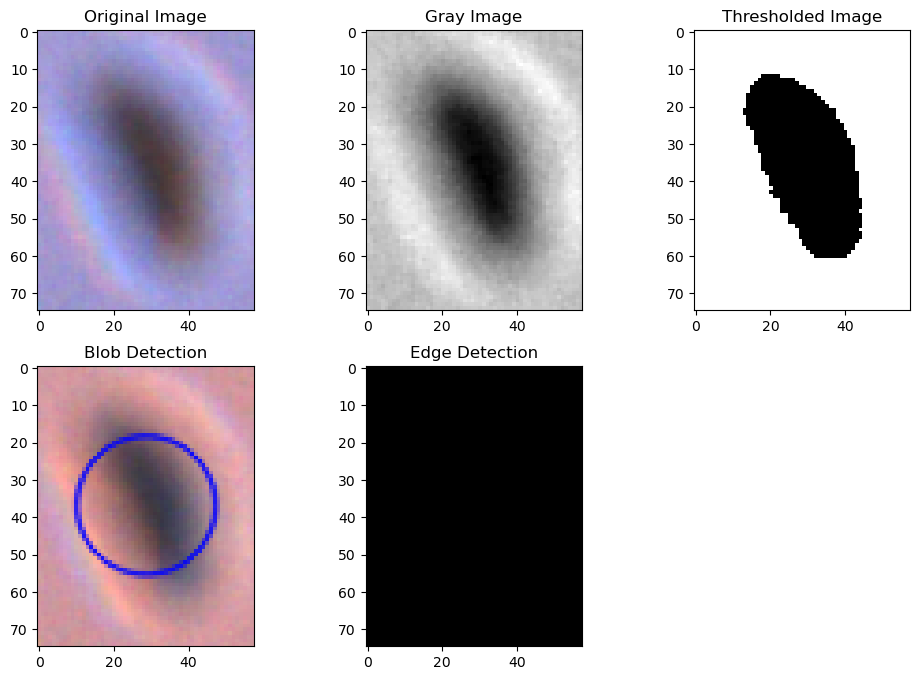

In [4]:
"""
EDA of the images and how they respond to different CV algorithms
"""

def visualize_filter_options(image_path):
    # load the image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # thresholding
    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

    # blob Detection
    params = cv2.SimpleBlobDetector_Params()
    params.filterByArea = True
    params.minArea = 100
    detector = cv2.SimpleBlobDetector_create(params)
    keypoints = detector.detect(thresh)

    # draw detected blobs as red circles
    blobs = cv2.drawKeypoints(image, keypoints, None, (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # edge detection
    edges = cv2.Canny(gray, 100, 200)

    # histogram analysis (wasnt much to learn from histogram for this case)
    #plt.figure()
    #plt.hist(gray.ravel(), 256, [0, 256])
    #plt.title("Histogram for Gray Scale Image")

    # display
    plt.figure(figsize=(12, 8))
    plt.subplot(231), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
    plt.subplot(232), plt.imshow(gray, cmap='gray'), plt.title('Gray Image')
    plt.subplot(233), plt.imshow(thresh, cmap='gray'), plt.title('Thresholded Image')
    plt.subplot(234), plt.imshow(blobs), plt.title('Blob Detection')
    plt.subplot(235), plt.imshow(edges, cmap='gray'), plt.title('Edge Detection')
    plt.show()

img_1 = "G:\My Drive\School\cs4347\jjp176\project\data\IN-All-Split\IN-2A\IN-2A_000011.png" # obvious cell
img_2 = "G:\My Drive\School\cs4347\jjp176\project\data\IN-All-Split\IN-2A\IN-2A_000001.png" # obvious blank
img_3 = "G:\My Drive\School\cs4347\jjp176\project\data\IN-All-Split\IN-2A\IN-2A_000021.png" 
img_4 = "G:\My Drive\School\cs4347\jjp176\project\data\IN-All-Split\IN-2A\IN-2A_000035.png" # blob detection catches images we do not want
visualize_filter_options(img_1)
visualize_filter_options(img_2)
visualize_filter_options(img_3)
visualize_filter_options(img_4)

In the first plot, we see that this cell image has edges, so we say it is signifigant.

Otherwise, in the other three plots, we see that this cell image has no edges, so we throw it out.

The second plot has a cell that we would maybe want to consider keeping, but after analyzing some manual annotations, this cell would later be thrown out anyway.

### EDA of CSV Data

#### Outlier Detection from CSV Data

Outlier detection was performed on various features like image width and height, and average color channels (red, green, blue). Box plots were used to visualize these features, helping to identify outliers in the data.

The `detect_outliers` function was used to identify indices of outliers in these features, which were then visually inspected. This step is crucial in understanding data variability and ensuring the robustness of the model.


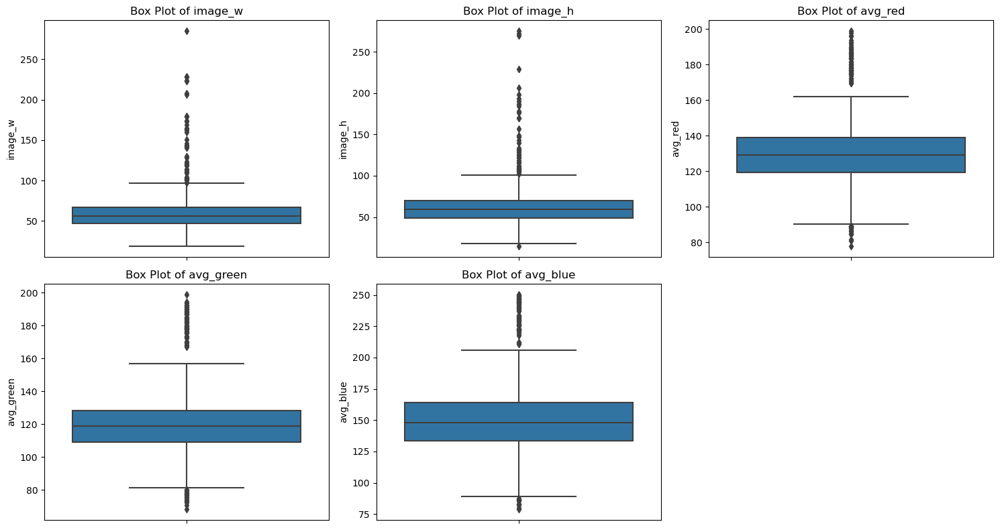

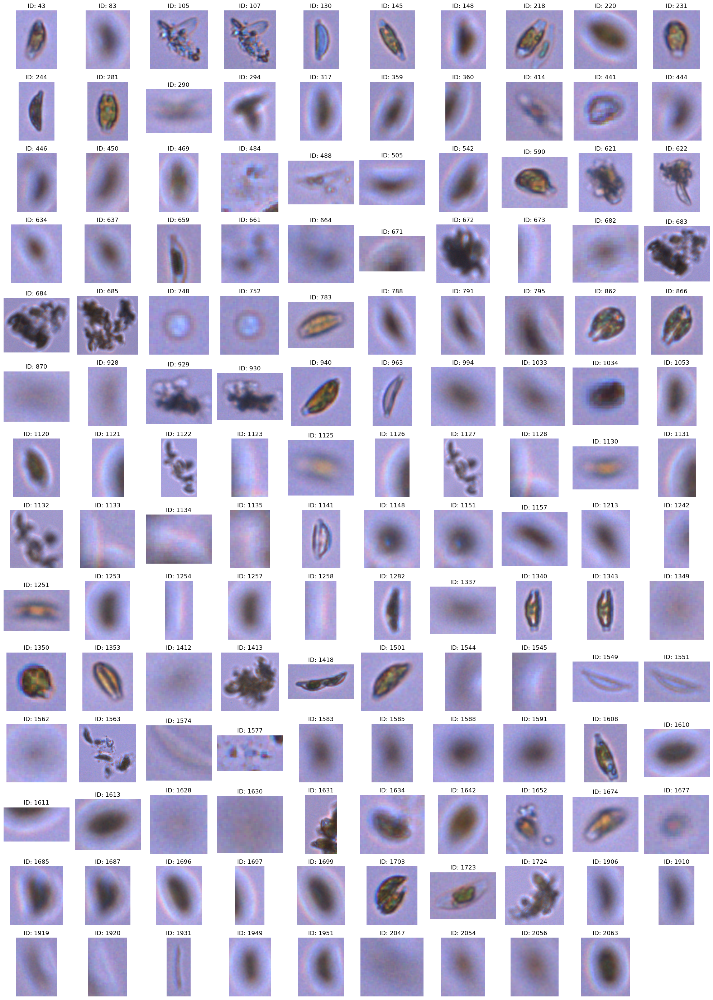

In [5]:
"""
Did not amount to much, outliers are sometimes cells we want to "keep" I think.
"""

def detect_outliers(df, features):
    outlier_indices = []

    for c in features:
        # 1st quartile (25%)
        Q1 = df[c].quantile(0.25)
        # 3rd quartile (75%)
        Q3 = df[c].quantile(0.75)
        # interquartile range
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # determine a list of indices of outliers for feature c
        outlier_list_col = df[(df[c] < Q1 - outlier_step) | (df[c] > Q3 + outlier_step)].index

        # append the found outlier indices for c to the list of outlier indices
        outlier_indices.extend(outlier_list_col)

    # select observations containing more than 2 outliers
    outlier_indices = list(set(outlier_indices))
    return outlier_indices


# plotting box plots for the features and then detecting outliers
features_to_plot = ['image_w', 'image_h', 'avg_red', 'avg_green', 'avg_blue']

plt.figure(figsize=(15, 8))
for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(y=df[feature])
    plt.title(f'Box Plot of {feature}')

plt.tight_layout()
plt.show()

outliers = detect_outliers(df, features_to_plot)
outliers.sort() # order

image_directory = 'data\\IN-All-Split\\IN-2A'

fig, axes = plt.subplots(14, 10, figsize=(20, 28))

# iterate over each subplot and display the corresponding image
for i, ax in enumerate(axes.flatten()):
    if i < len(outliers):
        image_id = outliers[i]
        image_path = os.path.join(image_directory, f'IN-2A_{str(image_id).zfill(6)}.png')
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        ax.set_title(f'ID: {image_id}')
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
#plt.show()


This didn't result in much, because the some of the outliers were actual images we would want to evaluate, but it was a valuable test.

#### Correlation

A correlation matrix was computed for the numerical columns of the dataset. This heatmap visualization helps in understanding the relationships between different variables and is instrumental in feature selection for the machine learning model.

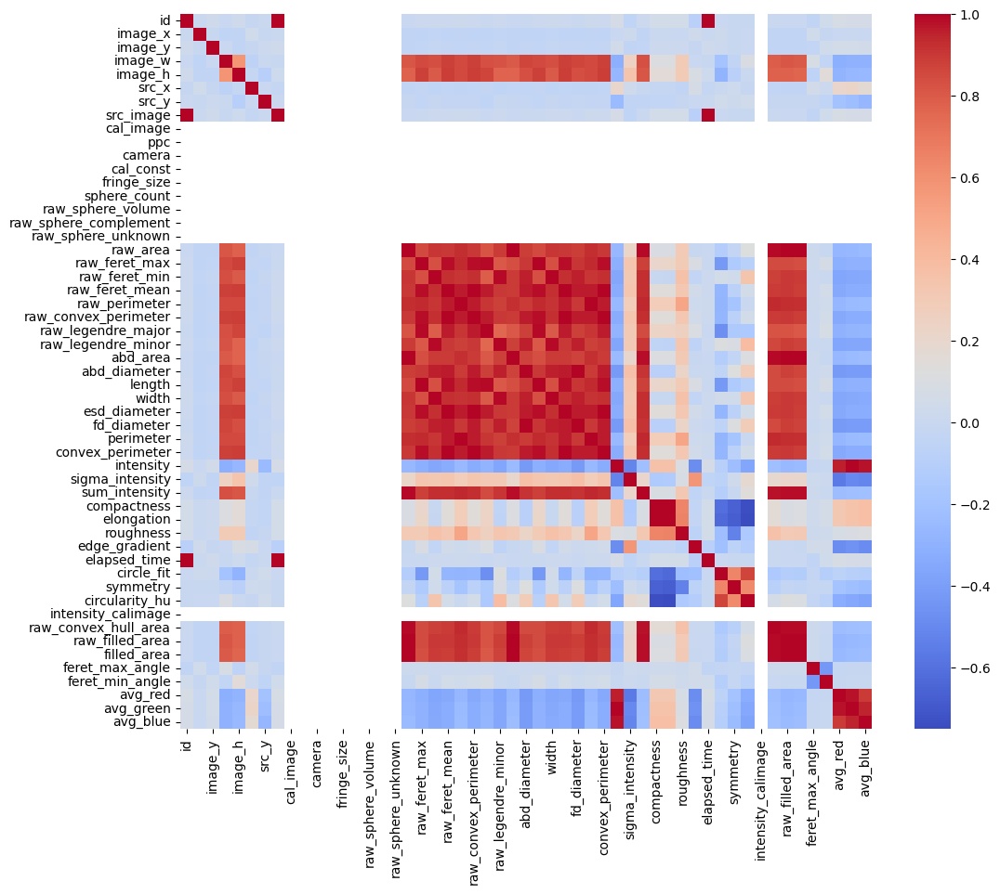

In [6]:
# filter out non-numerical columns
numeric_df = df.select_dtypes(include=[np.number])

# correlation matrix
correlation_matrix = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".1f")
plt.show()
correlation_matrix.to_csv('cm.csv')

### T-SNE

Images belonging to specific clusters identified through t-SNE with K-Means were visually inspected. This analysis is critical to ascertain if clusters correspond to meaningful categories, such as cells vs. empty images.

We started with a naked t-SNE, meaning we simply just plot the clusters all as "one" class.

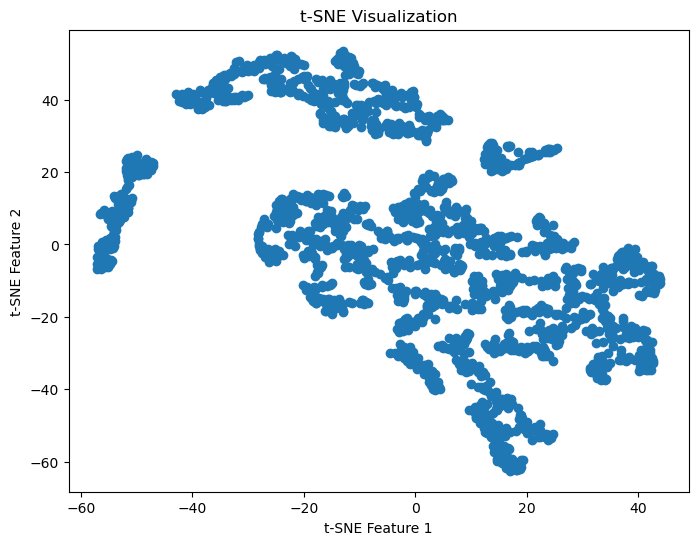

In [7]:
"""
Naked T-SNE
"""

# selecting shape and texture features for analysis (consider other features in future)
features = ['circularity_hu', 'raw_convex_hull_area']

# standardizing the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

# applying t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
tsne_results = tsne.fit_transform(scaled_features)

# plotting the results of t-SNE
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.title("t-SNE Visualization")
plt.xlabel("t-SNE Feature 1")
plt.ylabel("t-SNE Feature 2")
plt.show()


We then pivoted to using k-Means to find our clusters within the naked t-SNE

c:\Users\trist\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


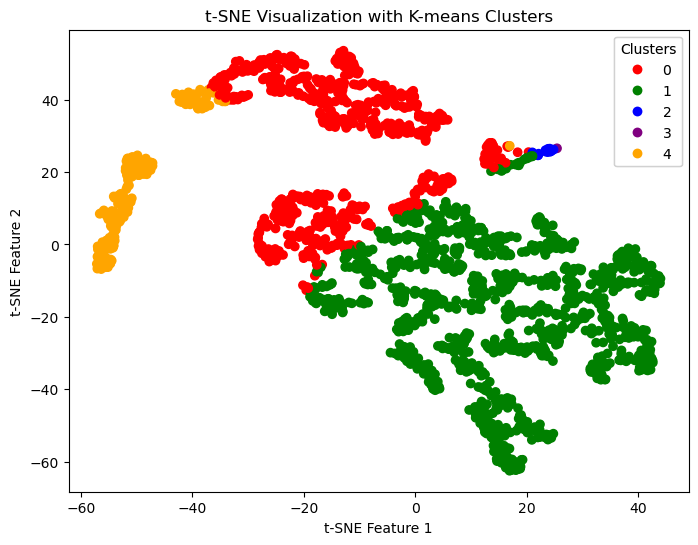

In [8]:
"""
t-SNE with K-Means (discrete legend)
"""
# selecting shape and texture features for analysis (consider other features in future)
features = ['circularity_hu', 'raw_convex_hull_area']

# standardizing the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

# apply K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=0)
clusters = kmeans.fit_predict(scaled_features)

# apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
tsne_results = tsne.fit_transform(scaled_features)

# plotting the results of t-SNE with cluster labels
plt.figure(figsize=(8, 6))

# define discrete colormap
colors = ['red', 'green', 'blue', 'purple', 'orange']
cmap = mcolors.ListedColormap(colors)

# scatter plot
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=clusters, cmap=cmap)

# create a legend
legend1 = plt.legend(*scatter.legend_elements(),
                    loc="upper right", title="Clusters")
plt.gca().add_artist(legend1)

plt.title("t-SNE Visualization with K-means Clusters")
plt.xlabel("t-SNE Feature 1")
plt.ylabel("t-SNE Feature 2")
plt.show()

This step led to understandings about the data, but we will revisit later to have stronger conclusions.

### Feature Matching in Images

- **Purpose:** Enhance data organization and aid in more efficient data analysis by grouping similar images, identifying patterns, and commonalities among cell images.
- **Technique:** Used SIFT to compare images based on key features and group similar ones.

- **TO RUN:** Hard coded paths to images for analysis purposes

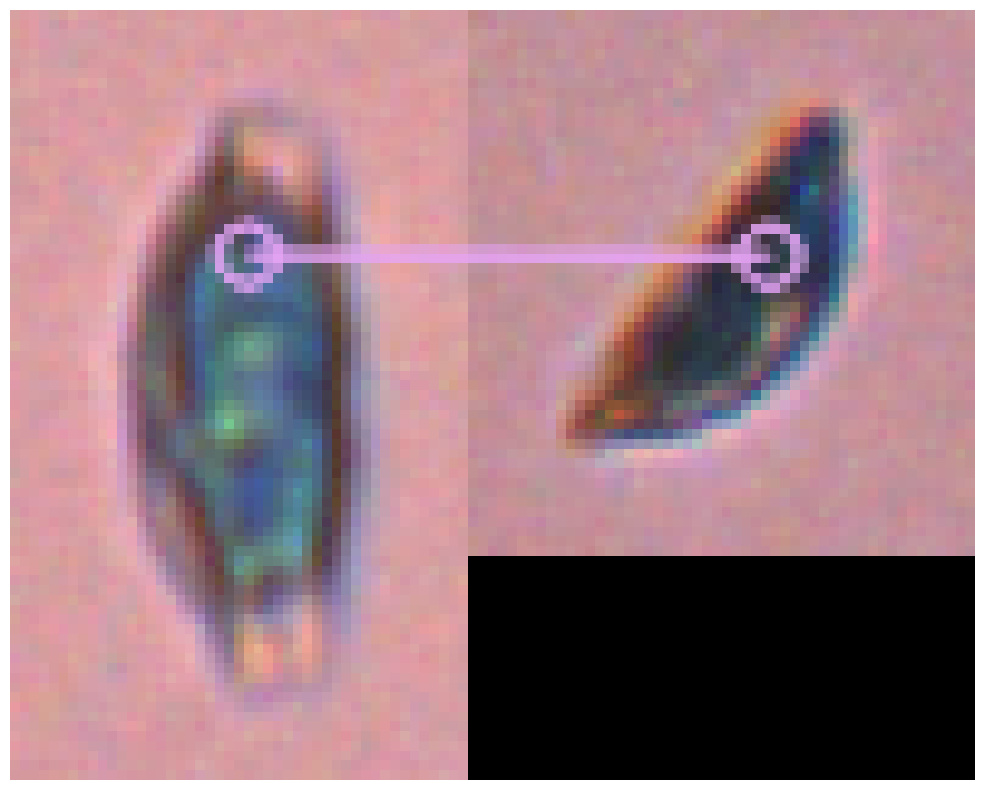

In [9]:
# load specific images for testing
color_img1 = cv2.imread('data/IN-All-Split/IN-2A/IN-2A_000010.png', cv2.COLOR_BGR2GRAY)  # query image
color_img2 = cv2.imread('data/IN-All-Split/IN-2A/IN-2A_000056.png', cv2.COLOR_BGR2GRAY)  # train image

# convert the images to grayscale for feature detection
gray_img1 = cv2.cvtColor(color_img1, cv2.COLOR_BGR2GRAY)
gray_img2 = cv2.cvtColor(color_img2, cv2.COLOR_BGR2GRAY)

# initialize the SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(gray_img1, None)
kp2, des2 = sift.detectAndCompute(gray_img2, None)

# create BFMatcher object with default parameters
bf = cv2.BFMatcher()

# match descriptors
matches = bf.knnMatch(des1, des2, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append([m])

# draw the matches
img_matches = cv2.drawMatchesKnn(color_img1, kp1, color_img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

output_path = 'feature_matching_result_sift.png'
cv2.imwrite(output_path, img_matches)

plt.figure(figsize=(20, 10))
plt.imshow(img_matches)
plt.axis('off')
plt.show()


## Filtering Functions

- **Idea:** Filtering out images that do not contain relevant cell information, often referred to as "empty" images.
- **Approach:** A custom algorithm using edge detection techniques is being employed to identify and exclude these empty images. The algorithm assesses the presence and quality of edges in an image to determine its relevance.
- **Ongoing Refinement:** This process is continuously being refined to ensure that no significant data is inadvertently filtered out.

- **TO RUN:** Provide a path to the directory with the images inside of it (after our previous filtering step). This will create a cell and empty directory to filter the images based on that criteria.

In [10]:
def filter_images_without_edges(directory_path):
    # folders for categorized images
    cell_folder = Path(directory_path) / "cell"
    empty_folder = Path(directory_path) / "empty"
    cell_folder.mkdir(exist_ok=True)
    empty_folder.mkdir(exist_ok=True)

    # iterate through each image in the directory
    for filename in os.listdir(directory_path):
        if filename.endswith(".png"):
            file_path = os.path.join(directory_path, filename)

            # read the image and convert it to grayscale
            image = cv2.imread(file_path, cv2.IMREAD_COLOR)
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # edge detection
            edges = cv2.Canny(gray, 100, 200)

            # check for edges
            if edges.sum() > 0:
                # any edges = cell img
                shutil.copy(file_path, cell_folder)
            else:
                # no edges = no cell
                shutil.copy(file_path, empty_folder)

directory_path = "data\IN-2A\Exported Images"

filter_images_without_edges(directory_path)

#### Grouping Cells

- **Implementation and Insights:** Extract features from each image, followed by pairwise comparisons to find matches. This grouping provides insights into the diversity and frequency of specific cell types or shapes in the dataset.
- **Results:** We had some wonderful groupings done by the current implementation algorithm, but there were difficulties, like in aggregate cell images, it shares features with tons of the images, skewing the features matched by a lot.

- **TO RUN:** Provide the path to the filtered cells from the algorithm above. This will be the "cell" directory.

In [11]:
def load_and_process_images(directory_path):
    images = {}
    sift = cv2.SIFT_create()
    for filename in os.listdir(directory_path):
        if filename.endswith(".png"):
            file_path = os.path.join(directory_path, filename)
            image = cv2.imread(file_path, cv2.IMREAD_COLOR)
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            kp, des = sift.detectAndCompute(gray, None)
            images[file_path] = (kp, des)
    return images

def find_similar_images(images, bf, match_threshold=15, max_similar_images=3):
    grouped_images = defaultdict(list)
    for file_path, (kp1, des1) in images.items():
        if des1 is None:
            continue
        for other_path, (kp2, des2) in images.items():
            if other_path == file_path or des2 is None:
                continue
            matches = bf.knnMatch(des1, des2, k=2)
            good_matches = [m for match in matches if len(match) == 2 and match[0].distance < 0.75 * match[1].distance]
            if len(good_matches) >= match_threshold:
                grouped_images[file_path].append(other_path)
        
        # exclude the image if it has more than max_similar_images similar images
        if len(grouped_images[file_path]) > max_similar_images:
            del grouped_images[file_path]

    return grouped_images

# initialize BFMatcher
bf = cv2.BFMatcher()

# load and process images
directory_path = 'data\IN-2A\Exported Images\cell'
images = load_and_process_images(directory_path)

# find similar images and group them
image_groups = find_similar_images(images, bf, match_threshold=15, max_similar_images=3)



#### Visualize Groupings

In [12]:
def plot_similar_images(main_image_path, similar_images):
    plt.figure(figsize=(15, 10))

    main_image = cv2.cvtColor(cv2.imread(main_image_path), cv2.COLOR_BGR2RGB)
    plt.subplot(1, len(similar_images) + 1, 1)
    plt.imshow(main_image)
    plt.title("Main Image")
    plt.axis('off')

    for i, img_path in enumerate(similar_images, start=2):
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        plt.subplot(1, len(similar_images) + 1, i)
        plt.imshow(image)
        plt.title(f"Similar {i-1}")
        plt.axis('off')

    plt.show()

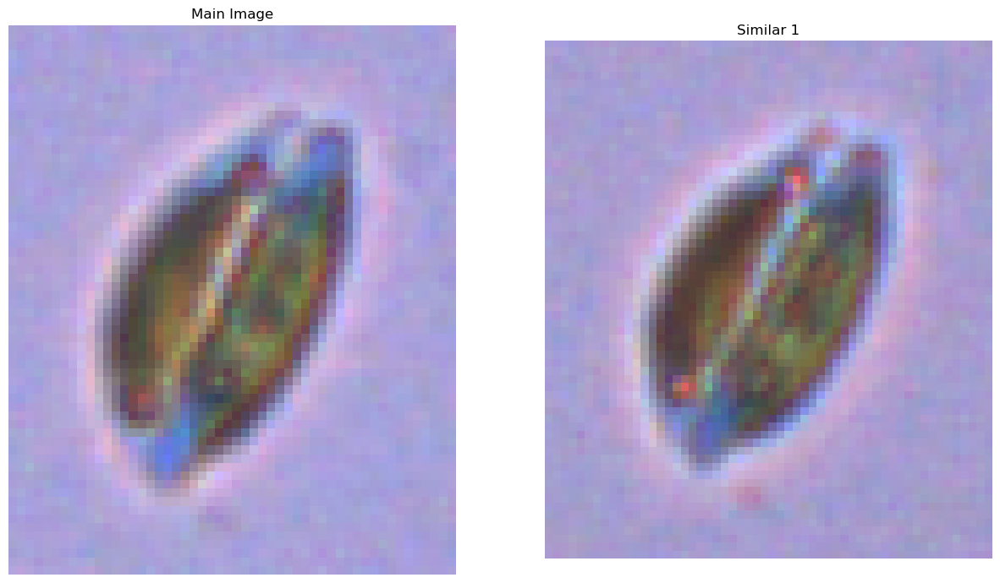

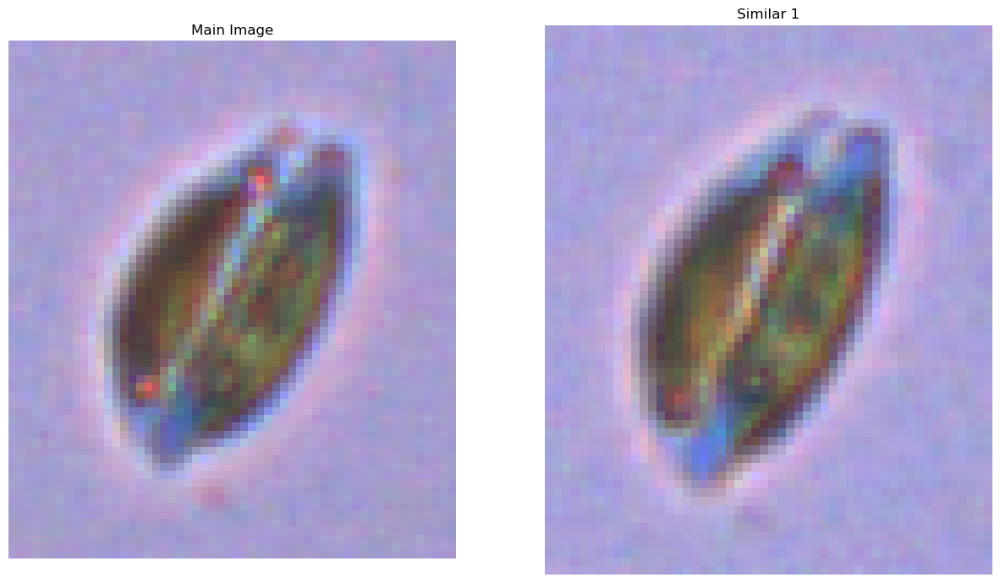

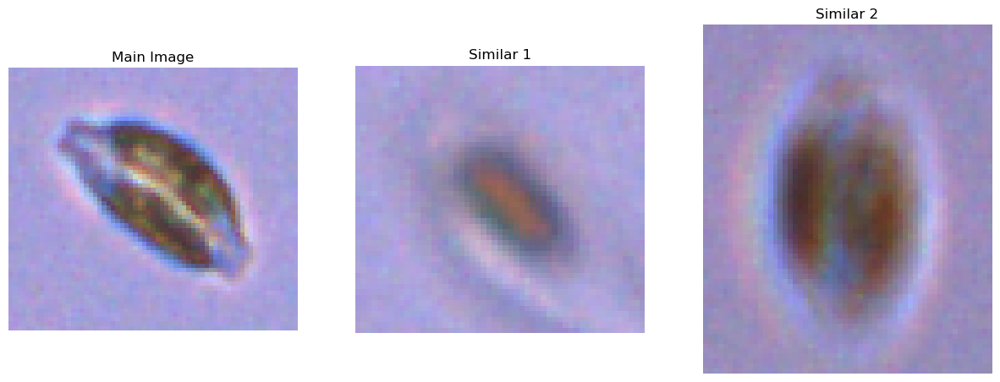

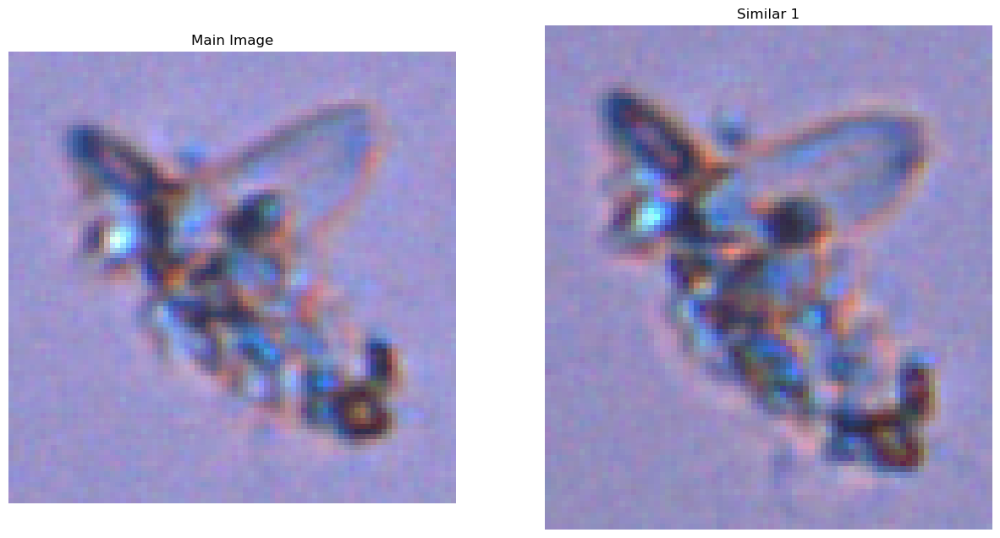

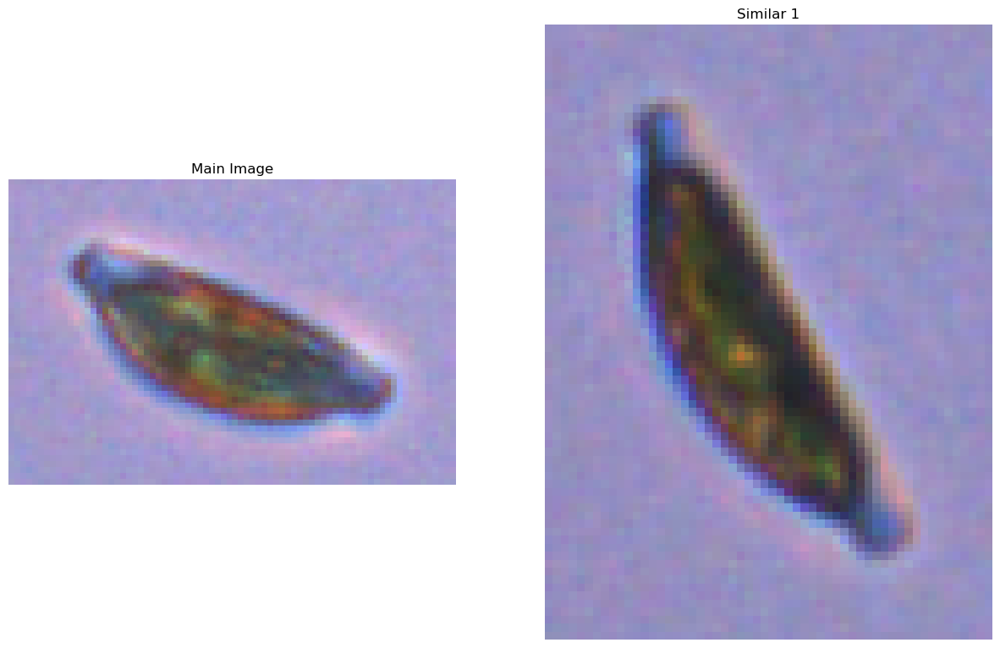

In [13]:
counter = 0
for main_image, similar_images in image_groups.items():
    if similar_images:
        plot_similar_images(main_image, similar_images)
        counter+=1
        if counter == 5:
            break

We can see, with an additional filtering of the aggregate images (that we don't care too much about in classification anyway), we get pretty good results at matching images that are similar at the given thresholds.

#### Continued t-SNE Analysis of Clustering

##### Plot t-SNE

I wanted to create an experiment where I took 20 images from each cluster of the k-Means t-SNE and visualized them to see if we see any obvious clustering. Keep in mind we created the t-SNE based on the textural features from the .lst file

c:\Users\trist\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


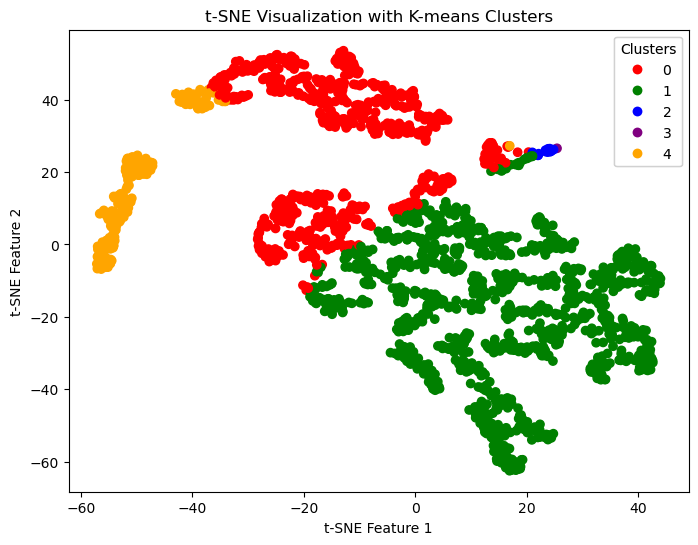

In [14]:
"""
t-SNE with K-Means (discrete legend)
"""
# selecting shape and texture features for analysis
features = ['circularity_hu', 'raw_convex_hull_area']

# standardizing the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

# apply K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=0)
clusters = kmeans.fit_predict(scaled_features)

# apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
tsne_results = tsne.fit_transform(scaled_features)

# plotting the results of t-SNE with cluster labels
plt.figure(figsize=(8, 6))

# define discrete colormap
colors = ['red', 'green', 'blue', 'purple', 'orange']
cmap = mcolors.ListedColormap(colors)

# scatter plot
scatter = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=clusters, cmap=cmap)

# create a legend
legend1 = plt.legend(*scatter.legend_elements(),
                    loc="upper right", title="Clusters")
plt.gca().add_artist(legend1)

plt.title("t-SNE Visualization with K-means Clusters")
plt.xlabel("t-SNE Feature 1")
plt.ylabel("t-SNE Feature 2")
plt.show()

##### Plot 20 Results from Each Cluster

In [15]:
base_path = r"data\IN-2A\Exported Images"
prefix = "IN2-A 08-16-23 1-100 Dilution_"

image_paths = [os.path.join(base_path, f"{prefix}{str(id).zfill(5)}.png") for id in df['id']]

image_cluster_map = {image_path: cluster for image_path, cluster in zip(image_paths, clusters)}

In [16]:
selected_images_per_cluster = defaultdict(list)

for image_path, cluster_label in image_cluster_map.items():
    if len(selected_images_per_cluster[cluster_label]) < 20:  # Limit to 20 images per cluster
        selected_images_per_cluster[cluster_label].append(image_path)


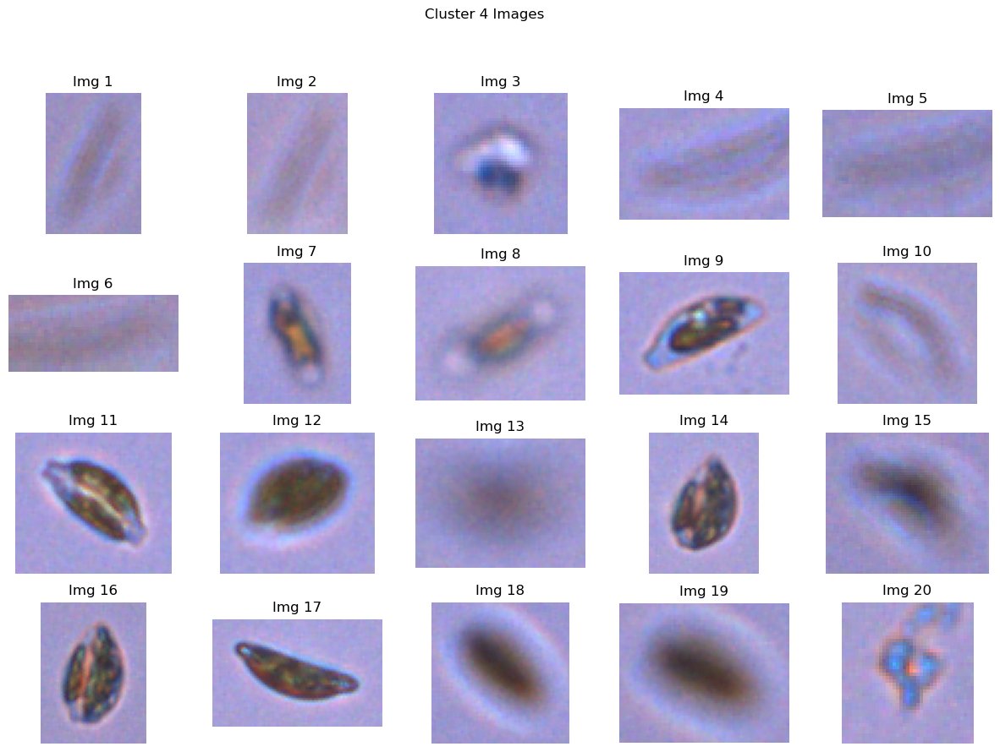

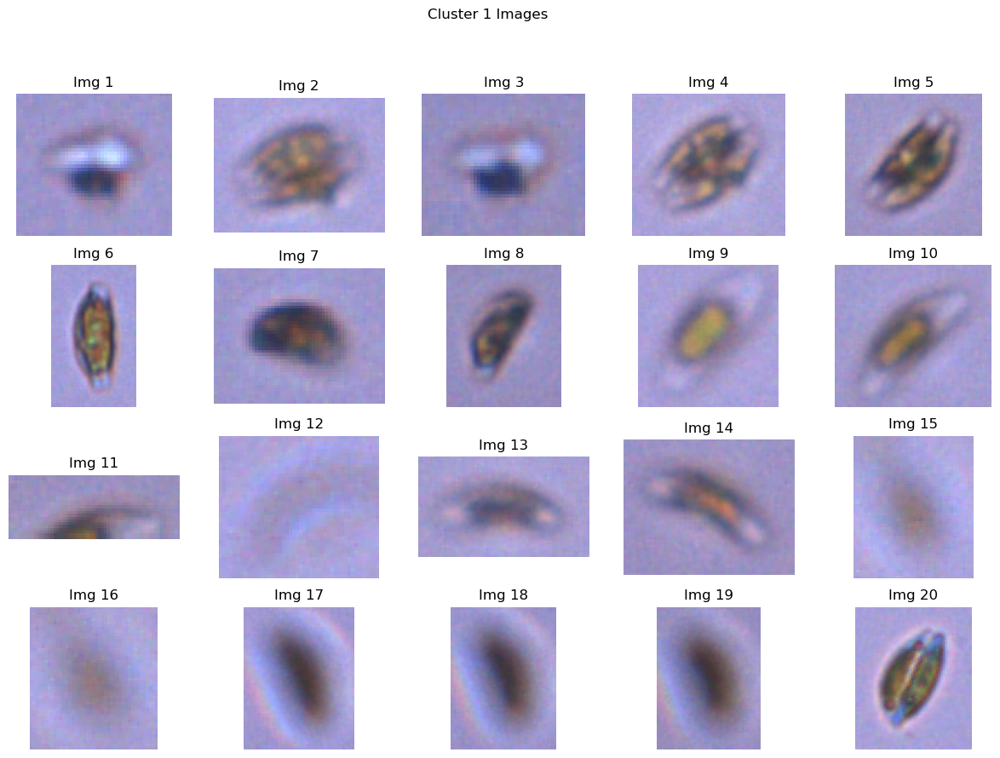

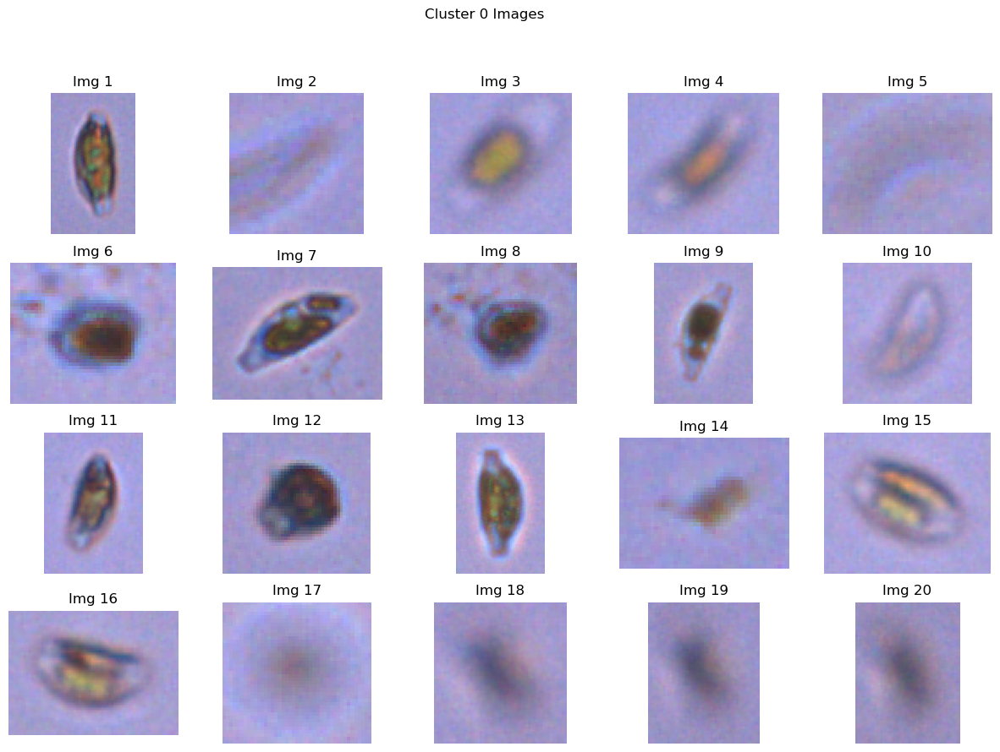

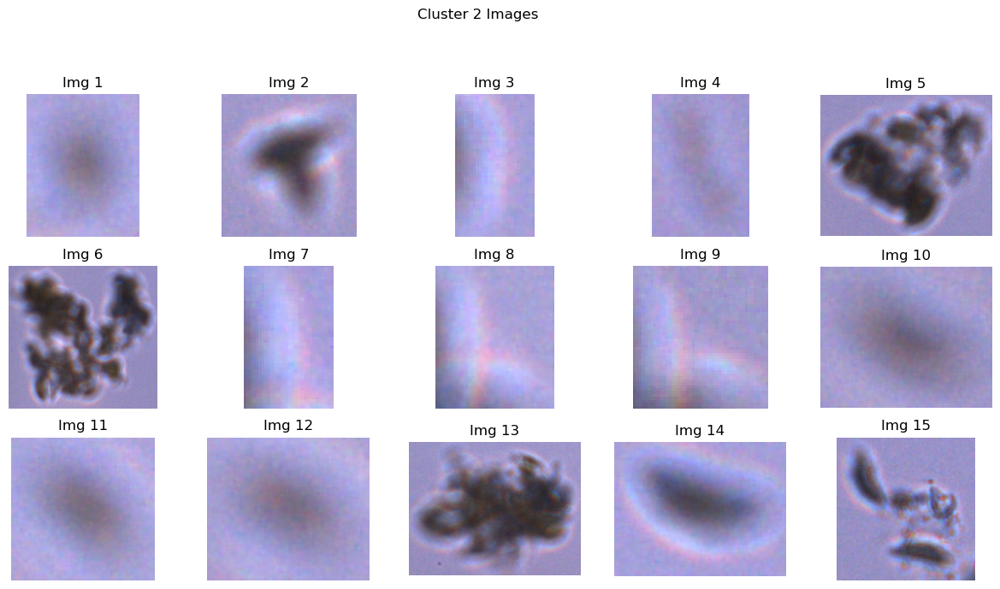

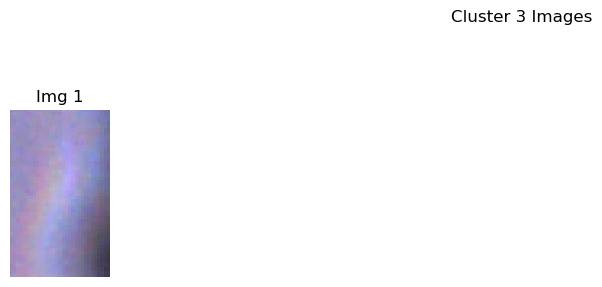

In [17]:
for cluster_label, image_paths in selected_images_per_cluster.items():
    plt.figure(figsize=(15, 10))
    plt.suptitle(f'Cluster {cluster_label} Images')
    for i, img_path in enumerate(image_paths):
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        plt.subplot(4, 5, i + 1)  # Adjust subplot grid as needed
        plt.imshow(image)
        plt.title(f"Img {i+1}")
        plt.axis('off')
    plt.show()

- **t-SNE and Clustering Insights:** The t-SNE visualization with K-means clustering (K=5) provided valuable insights but did not yield conclusive results. The visual inspection of clusters indicated that while some grouping was evident, it was not distinct enough to draw definitive conclusions.

# It ends here. It's definitely true preprocessing is the bulk of work in ML.